# Linear Discriminant Analysis - Demonstration
## Without dimensionality reduction

In [1]:
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.datasets import fetch_openml
from sklearn.decomposition import PCA
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import cross_val_score
from LinearDiscriminantAnalysis import LinearDiscriminantAnalysis

In [2]:
# Configuration:
np.set_printoptions(precision=4, suppress=True)
warnings.filterwarnings("ignore", category=UserWarning)

In [3]:
# Dataset:
mnist = fetch_openml('mnist_784', version=1, data_home='.', as_frame=True)
mnist.frame['target'] = mnist.target

In [4]:
# Function for displaying part of the dataset:
def print_mnist(X, y=None, title=None):
    fig = plt.figure(figsize=(8, 8))
    fig.subplots_adjust(left=0, right=1, bottom=0, top=1, hspace=0.05, wspace=0.05)
    
    n_samples = X.shape[0]
    images = X.reshape(-1, 28, 28)
    for i in range(min(n_samples, 12 * 12)):
        ax = fig.add_subplot(12, 12, i + 1, xticks=[], yticks=[])
        ax.imshow(images[i], cmap=plt.cm.binary, interpolation='nearest')
        if y is not None:
            ax.text(0, 7, str(y[i]))
    
    fig.suptitle(title, y=1.08, fontsize=22)

In [5]:
X = mnist.data.to_numpy()
y = mnist.target.to_numpy()

X.shape, y.shape

((70000, 784), (70000,))

## PCA Transformation
This is the pairplot of the first 8 dimensions of the MNIST dataset from Sci-Kit Learn after applying PCA.

In [6]:
pca = PCA(random_state=42)
X_pca = pca.fit_transform(X)

X_pca.shape

(70000, 784)

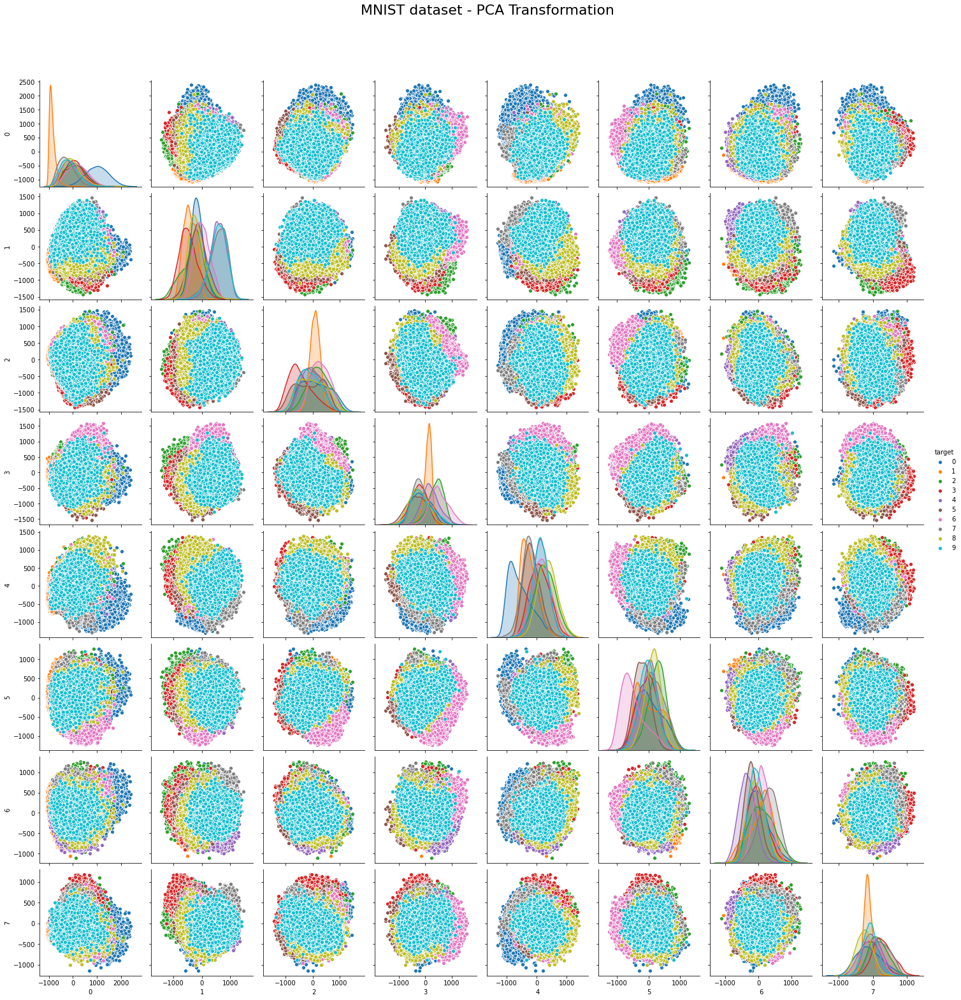

In [7]:
mnist_pca = pd.DataFrame.from_records(X_pca[:, :8])
mnist_pca['target'] = y
g = sns.pairplot(mnist_pca, hue="target")
g.fig.suptitle(f"MNIST dataset - PCA Transformation", y=1.08, fontsize=22);

In [8]:
X_pca_inv = pca.inverse_transform(X_pca)

X_pca_inv.shape

(70000, 784)

## LDA Transformation (without intra-class clustering)
This is the pairplot of the first 8 dimensions of the MNIST dataset from Sci-Kit Learn after applying LDA.

In [9]:
lda = LinearDiscriminantAnalysis(random_state=42)
X_lda = lda.fit_transform(X, y, class_clustering=False, verbose=True)

X_lda.shape

Targets were provided: using the labeled data.

Mu:
[[  0.       0.       0.       0.       0.       0.       0.       0.
    0.       0.       0.       0.       0.0018   0.0067   0.0031   0.0001
    0.       0.       0.       0.       0.       0.       0.       0.
    0.       0.       0.       0.       0.       0.       0.       0.
    0.0002   0.0013   0.0113   0.0231   0.0432   0.0622   0.1179   0.1712
    0.1934   0.1901   0.2063   0.1827   0.1701   0.1445   0.0992   0.0682
    0.0489   0.0183   0.0086   0.003    0.       0.       0.       0.
    0.       0.       0.0009   0.0006   0.006    0.0109   0.0563   0.1394
    0.2682   0.521    0.9166   1.4125   2.0055   2.6448   3.2949   3.6582
    3.6887   3.3026   2.7046   1.9718   1.1747   0.608    0.2864   0.0918
    0.0303   0.0074   0.       0.       0.       0.       0.0028   0.005
    0.0132   0.0703   0.2188   0.5492   1.1733   2.2705   3.782    5.6468
    7.6889   9.9488  11.987   13.2303  12.9729  11.5404   9.3011   6.6749
   

Mu_c[1]:
[  0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.0396   0.0645   0.009    0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.0109   0.0507   0.1085   0.2062   0.2912   0.3518
   0.2078   0.0611   0.0229   0.0321   0.0076   0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.0053   0.0013
   0.       0.       0.       0.0037   0.0042   0.05     0.0966   0.2143
   0.4739   1.2345   1.7018   1.7856   1.446    1.2817   1.0042   0.742
   0.3958   0.2239   0.1108   0.0185   0.       0.       0.       0.
   0.     

Mu_c[6]:
[  0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.0169   0.0369   0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.0023   0.008    0.081    0.2096   0.3656   0.5609   1.1121   1.6207
   1.8749   1.8339   1.8519   1.587    1.3867   1.3301   0.9999   0.6946
   0.4975   0.1864   0.088    0.0308   0.       0.       0.       0.
   0.       0.       0.0093   0.0019   0.0592   0.051    0.3714   1.0481
   2.1126   4.0652   7.306   11.4414  16.6994  22.7257  28.8758  32.5084
  33.7081  31.1763  26.1811  19.2593  11.5899   6.0606   2.8495   0.8921
   0.2574   0.0513   0.       0.       0.       0.       0.0205   0.0346
   0.0718   0.2293   0.7839   2.2102   4.6342   9.0416  15.7666  24.308
  34.8162  48.6805  64.3982  76.445   79.9689  75.732   64.8223  47.5892
  29.0429  15.4298   7.2602   2.7424   1.0855   0.2032   0.0413

S_intra:
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]

S_inter:
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]

Singular values:
Singular value 1: 	23.72%   	3.83105  	 Accepted
Singular value 2: 	20.35%   	3.28645  	 Accepted
Singular value 3: 	17.73%   	2.86456  	 Accepted
Singular value 4: 	10.70%   	1.72874  	 Accepted
Singular value 5: 	9.44%    	1.52483  	 Accepted
Singular value 6: 	6.91%    	1.11566  	 Accepted
Singular value 7: 	5.01%    	0.809705 	 Accepted
Singular value 8: 	3.45%    	0.556763 	 Accepted
Singular value 9: 	2.69%    	0.434546 	 Accepted
Singular value 10: 	0.00%    	1.01996e-14 	 Rejected
Singular value 11: 	0.00%    	1.01996e-14 	 Rejected
Singular value 12: 	0.00%    	8.82308e-15 	 Rejected
Singular value 13: 	0.00%    	8.41812e-15 	 Rejecte

W:
[[ 0.      0.      0.     ...  0.0269 -0.0107  0.0234]
 [ 0.      0.      0.     ...  0.0915  0.0133 -0.0502]
 [ 0.      0.      0.     ...  0.0039  0.0627 -0.0297]
 ...
 [ 0.      0.      0.     ...  0.0295 -0.0307 -0.0143]
 [ 0.      0.      0.     ... -0.0107  0.0112  0.0008]
 [ 0.      0.      0.     ... -0.0066  0.0046  0.0198]]



(70000, 784)

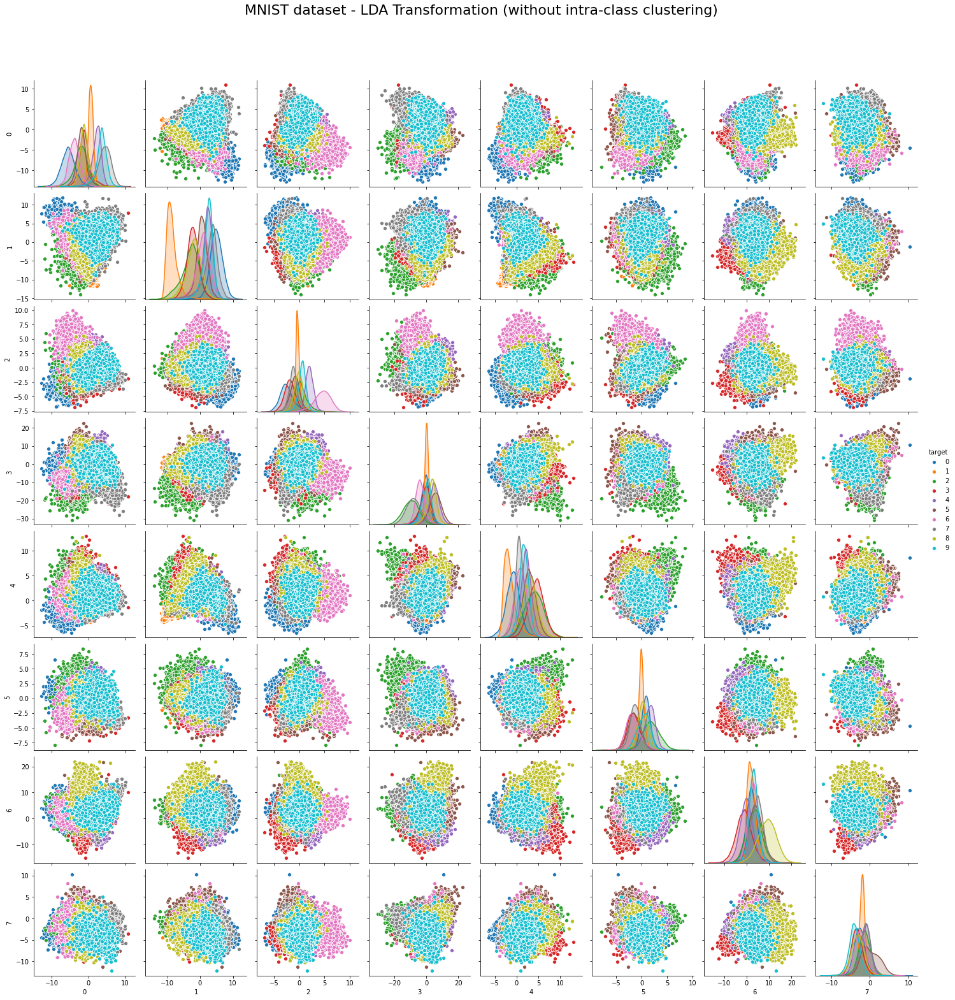

In [10]:
mnist_lda = pd.DataFrame.from_records(X_lda[:, :8])
mnist_lda['target'] = y
g = sns.pairplot(mnist_lda, hue="target")
g.fig.suptitle(f"MNIST dataset - LDA Transformation (without intra-class clustering)", y=1.08, fontsize=22);

In [11]:
X_lda_inv = lda.inverse_transform(X_lda, verbose=True)

X_lda_inv.shape

(70000, 784)

## LDA Transformation (with intra-class clustering)
This is the pairplot of the first 8 dimensions of the MNIST dataset from Sci-Kit Learn after applying LDA.

In [12]:
ldacc = LinearDiscriminantAnalysis(random_state=42)
X_ldacc = ldacc.fit_transform(X, y, min_clusters=1, max_clusters=2, class_clustering=True, verbose=True)

X_ldacc.shape

No target is provided: using unsupervised clustering.

Searching for an optimal number of clusters within class 0 for values between 1 and 2...

1 clusters: 	AIC: 60424075.200, 	BIC: 60429444.374  
2 clusters: 	AIC: 59692611.663, 	BIC: 59703356.849  
Optimal number of clusters for class 0 found: 2

No target is provided: using unsupervised clustering.

Searching for an optimal number of clusters within class 1 for values between 1 and 2...

1 clusters: 	AIC: 64026275.682, 	BIC: 64031748.468  
2 clusters: 	AIC: 61938373.361, 	BIC: 61949325.905  
Optimal number of clusters for class 1 found: 2

No target is provided: using unsupervised clustering.

Searching for an optimal number of clusters within class 2 for values between 1 and 2...

1 clusters: 	AIC: 61276623.774, 	BIC: 61282002.779  
2 clusters: 	AIC: 60790112.776, 	BIC: 60800877.638  
Optimal number of clusters for class 2 found: 2

No target is provided: using unsupervised clustering.

Searching for an optimal number of clusters w

Mu_c[4]:
[  0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.0032   0.0696   0.0696   0.0029
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.0122   0.0761   0.0509   0.0751   0.0464   0.       0.
   0.0016   0.0793   0.2427   0.2527   0.2465   0.1315   0.019    0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.0161   0.0928   0.1721
   0.3197   0.7796   1.1885   1.8315   2.6581   3.602    4.8956   5.6287
   4.8382   3.2888   1.8746   0.9797   0.3306   0.0709   0.0039   0.0664
   0.03     0.       0.       0.       0.       0.       0.0035   0.0048
   0.       0.1644   0.4531   1.1876   2.8514   6.2169  11.7222  18.3777
  27.3432  37.4863  45.7812  51.6001  51.4692  45.1341  33.8195  21.5143
  11.0209   4.485    1.4067   0.2146   0.011    0.       0.       

Mu_c[11]:
[  0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.0465
   0.0511   0.1776   0.3147   0.2777   0.1586   0.012    0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.0014
   0.0694   0.0402   0.       0.       0.       0.       0.       0.1216
   0.3048   0.2227   0.3661   0.8996   1.1519   1.6388   2.1959   2.4496
   2.2755   1.8284   1.4348   0.8471   0.3756   0.1187   0.0166   0.
   0.   

Mu_c[18]:
[  0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0. 

S_intra:
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]

S_inter:
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]

Singular values:
Singular value 1: 	16.21%   	4.11028  	 Accepted
Singular value 2: 	14.67%   	3.71817  	 Accepted
Singular value 3: 	11.76%   	2.98166  	 Accepted
Singular value 4: 	8.20%    	2.07831  	 Accepted
Singular value 5: 	7.85%    	1.98999  	 Accepted
Singular value 6: 	7.49%    	1.90006  	 Accepted
Singular value 7: 	6.13%    	1.55332  	 Accepted
Singular value 8: 	5.33%    	1.3512   	 Accepted
Singular value 9: 	4.36%    	1.10493  	 Accepted
Singular value 10: 	3.35%    	0.848325 	 Accepted
Singular value 11: 	2.82%    	0.713941 	 Accepted
Singular value 12: 	2.50%    	0.634798 	 Accepted
Singular value 13: 	1.90%    	0.480454 	 Accepted
Singular v

W:
[[ 0.      0.      0.     ...  0.0269 -0.0107  0.0234]
 [ 0.      0.      0.     ...  0.0915  0.0133 -0.0502]
 [ 0.      0.      0.     ...  0.0039  0.0627 -0.0297]
 ...
 [ 0.      0.      0.     ...  0.0295 -0.0307 -0.0143]
 [ 0.      0.      0.     ... -0.0107  0.0112  0.0008]
 [ 0.      0.      0.     ... -0.0066  0.0046  0.0198]]



(70000, 784)

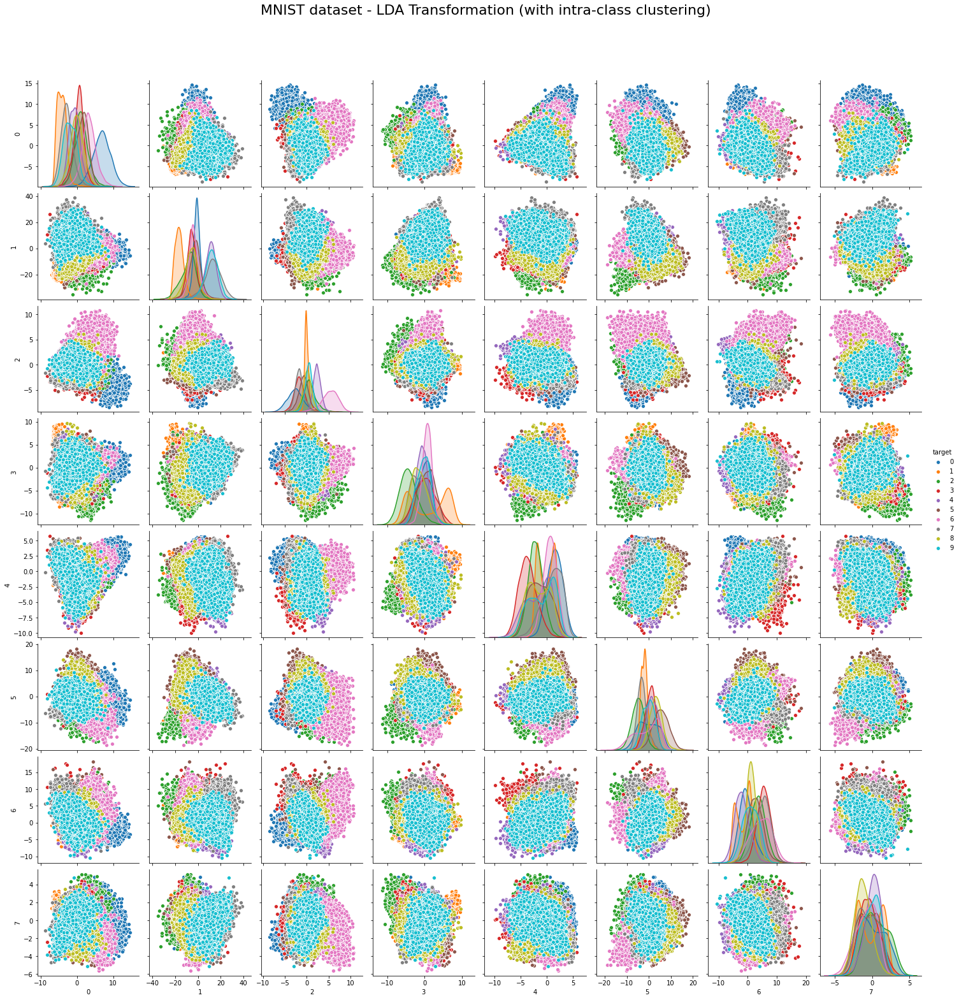

In [13]:
mnist_ldacc = pd.DataFrame.from_records(X_ldacc[:, :8])
mnist_ldacc['target'] = y
g = sns.pairplot(mnist_ldacc, hue="target")
g.fig.suptitle(f"MNIST dataset - LDA Transformation (with intra-class clustering)", y=1.08, fontsize=22);

In [14]:
X_ldacc_inv = ldacc.inverse_transform(X_ldacc, verbose=True)

X_ldacc_inv.shape

(70000, 784)

## Unsupervised LDA Transformation
This is the pairplot of the first 8 dimensions of the MNIST dataset from Sci-Kit Learn after applying Unsupervised LDA.

In [15]:
ulda = LinearDiscriminantAnalysis(random_state=42)
X_ulda = ulda.fit_transform(X, min_clusters=145, max_clusters=150, verbose=True)

X_ulda.shape

No target is provided: using unsupervised clustering.

Predicting the classes from the clusters...

Searching for an optimal number of clusters between 110 and 125...

110 clusters: 	AIC: 576676120.614, 	BIC: 577467760.878  
111 clusters: 	AIC: 576641352.460, 	BIC: 577440189.536  
112 clusters: 	AIC: 576558225.010, 	BIC: 577364258.900  
113 clusters: 	AIC: 576484370.990, 	BIC: 577297601.693  
114 clusters: 	AIC: 576437524.342, 	BIC: 577257951.858  
115 clusters: 	AIC: 576353621.597, 	BIC: 577181245.925  
116 clusters: 	AIC: 576319990.107, 	BIC: 577154811.248  
117 clusters: 	AIC: 576226465.870, 	BIC: 577068483.824  
118 clusters: 	AIC: 576183925.100, 	BIC: 577033139.867  
119 clusters: 	AIC: 576117645.882, 	BIC: 576974057.462  
120 clusters: 	AIC: 576052517.420, 	BIC: 576916125.813  
121 clusters: 	AIC: 575982904.950, 	BIC: 576853710.156  
122 clusters: 	AIC: 575934192.098, 	BIC: 576812194.117  
123 clusters: 	AIC: 575880348.724, 	BIC: 576765547.556  
124 clusters: 	AIC: 575833245.974,

Mu_c[21]:
[  0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.0906   0.4566   0.5819   1.1503   0.6031   0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0. 

Mu_c[44]:
[  0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.2636   0.2919   0.9085   2.6863   5.0828   4.8214
   3.2876   2.0871   1.8627   0.7647   0.1743   0.       0.       0.
   0.       0.      

Mu_c[66]:
[  0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.0701   0.31
   0.053    0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.3505   0.2773   0.0607   0.1386   0.       0.
   0.       0.       0.       0.2196   0.3551   0.1745   0.4579   0.419
   0.3193   0.       0.       0.       0.       0.       0.       0.
   0.       0.     

Mu_c[89]:
[  0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0. 

Mu_c[112]:
[  0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.0968   0.4048   0.2587   0.4746   0.2698   0.       0.
   0.       0.       0.       0.       0.       0.       0.       0.
   0.       0.       0.

S_intra:
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]

S_inter:
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]

Singular values:
Singular value 1: 	11.07%   	7.64743  	 Accepted
Singular value 2: 	9.15%    	6.32506  	 Accepted
Singular value 3: 	6.62%    	4.5741   	 Accepted
Singular value 4: 	6.36%    	4.398    	 Accepted
Singular value 5: 	5.11%    	3.53413  	 Accepted
Singular value 6: 	4.72%    	3.26089  	 Accepted
Singular value 7: 	4.21%    	2.91252  	 Accepted
Singular value 8: 	3.34%    	2.30632  	 Accepted
Singular value 9: 	3.12%    	2.15772  	 Accepted
Singular value 10: 	2.63%    	1.82042  	 Accepted
Singular value 11: 	2.23%    	1.5402   	 Accepted
Singular value 12: 	2.12%    	1.46406  	 Accepted
Singular value 13: 	2.06%    	1.42413  	 Accepted
Singular v

W:
[[ 0.      0.      0.     ...  0.0269 -0.0107  0.0234]
 [ 0.      0.      0.     ...  0.0915  0.0133 -0.0502]
 [ 0.      0.      0.     ...  0.0039  0.0627 -0.0297]
 ...
 [ 0.      0.      0.     ...  0.0295 -0.0307 -0.0143]
 [ 0.      0.      0.     ... -0.0107  0.0112  0.0008]
 [ 0.      0.      0.     ... -0.0066  0.0046  0.0198]]



(70000, 784)

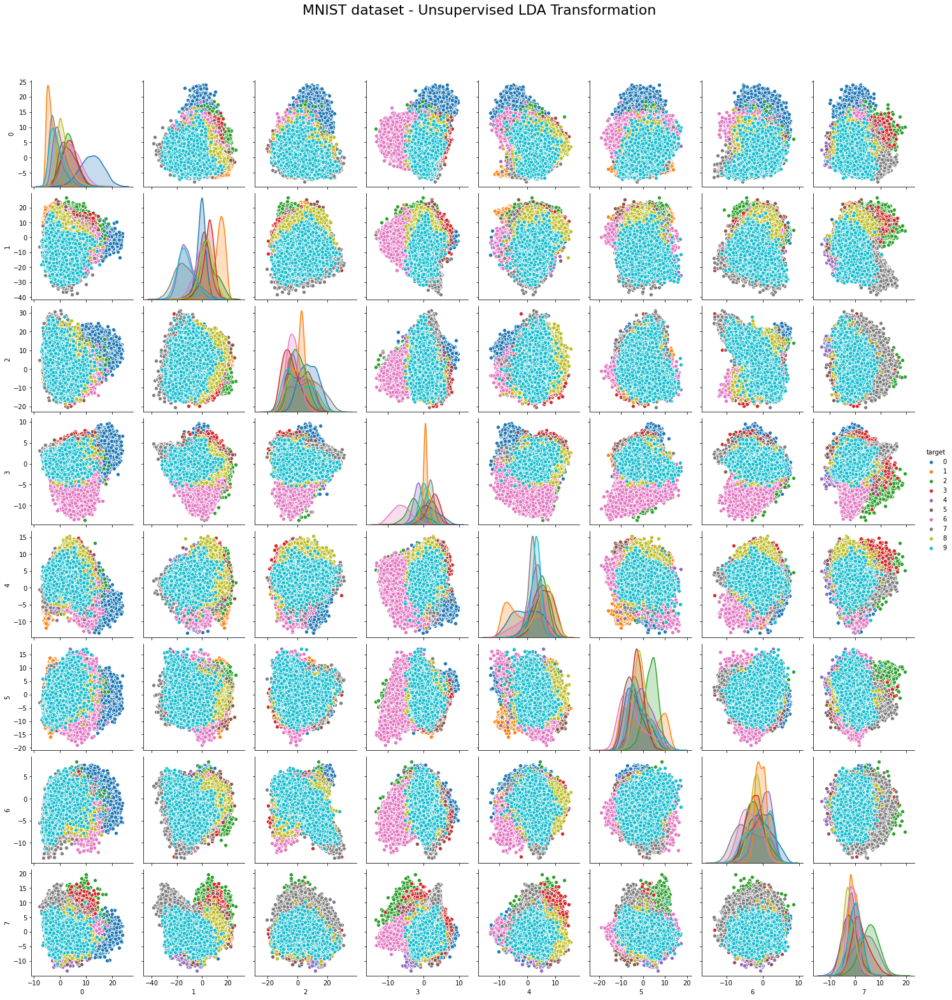

In [16]:
mnist_ulda = pd.DataFrame.from_records(X_ulda[:, :8])
mnist_ulda['target'] = y
g = sns.pairplot(mnist_ulda, hue="target")
g.fig.suptitle(f"MNIST dataset - Unsupervised LDA Transformation", y=1.08, fontsize=22);

In [17]:
X_ulda_inv = ulda.inverse_transform(X_ulda, verbose=True)

X_ulda_inv.shape

(70000, 784)

## Comparison of the inverse transformation

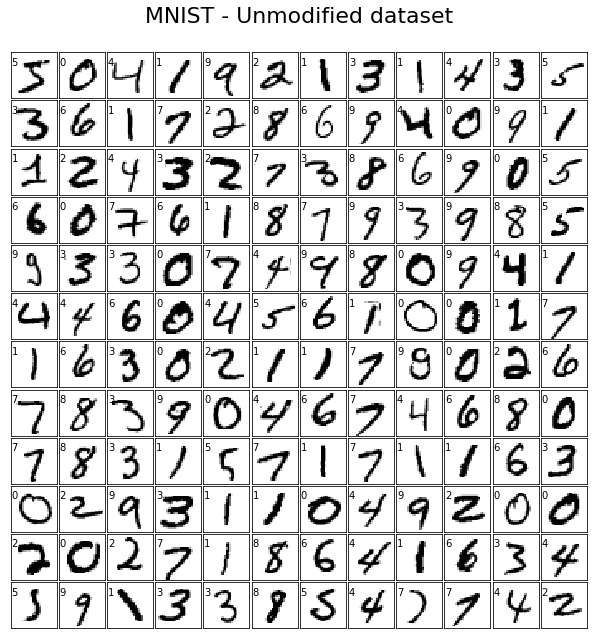

In [18]:
print_mnist(X, y, title="MNIST - Unmodified dataset")

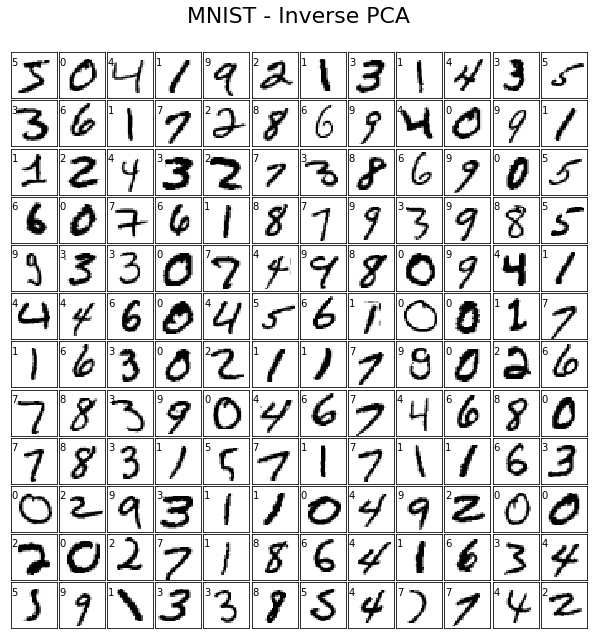

In [19]:
print_mnist(X_pca_inv, y, title="MNIST - Inverse PCA")

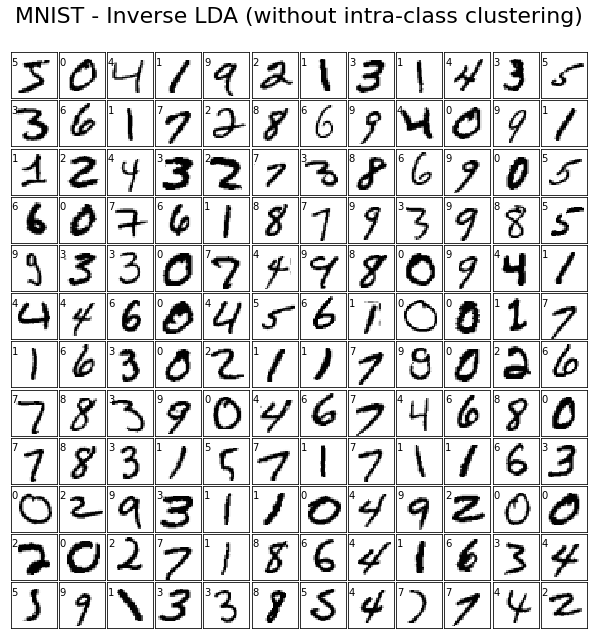

In [20]:
print_mnist(X_lda_inv, y, title="MNIST - Inverse LDA (without intra-class clustering)")

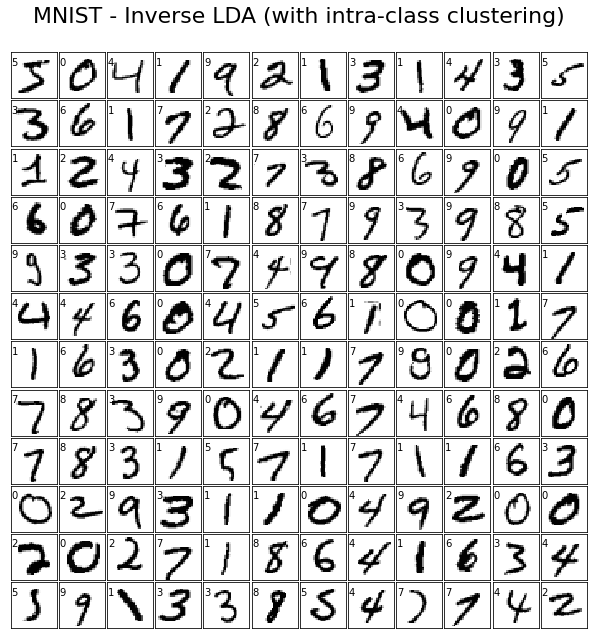

In [21]:
print_mnist(X_ldacc_inv, y, title="MNIST - Inverse LDA (with intra-class clustering)")

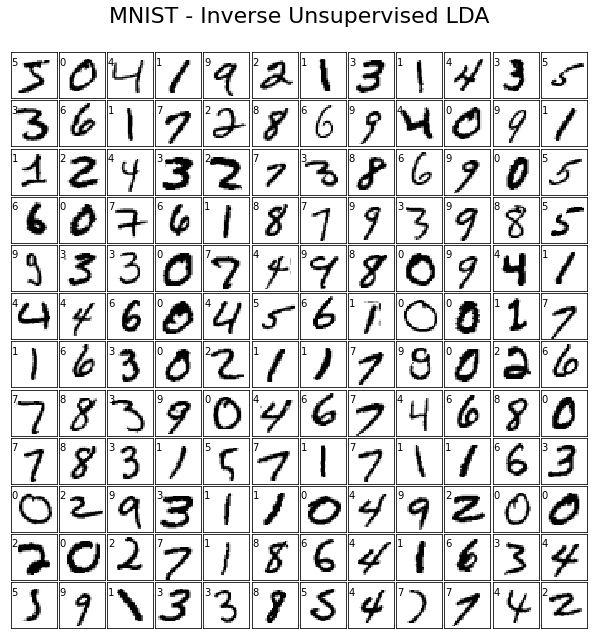

In [22]:
print_mnist(X_ulda_inv, y, title="MNIST - Inverse Unsupervised LDA")

## Comparison on different classifiers

In [23]:
gnb = GaussianNB()
res_original = np.mean(cross_val_score(gnb, X, y, cv=5, scoring='accuracy'))
res_pca = np.mean(cross_val_score(gnb, X_pca, y, cv=5, scoring='accuracy'))
res_lda = np.mean(cross_val_score(gnb, X_lda, y, cv=5, scoring='accuracy'))
res_ldacc = np.mean(cross_val_score(gnb, X_ldacc, y, cv=5, scoring='accuracy'))
res_ulda = np.mean(cross_val_score(gnb, X_ulda, y, cv=5, scoring='accuracy'))
print(f"Prediction score with Naive Bayes:\n"
      f" - Original dataset                       : {res_original:.2%}\n"
      f" - PCA transformation                     : {res_pca:.2%}\n"
      f" - LDA transformation (w/o clustering)    : {res_lda:.2%}\n"
      f" - LDA transformation (w/ clustering)     : {res_ldacc:.2%}\n"
      f" - Unsupervised LDA transformation        : {res_ulda:.2%}\n")

Prediction score with Naive Bayes:
 - Original dataset                       : 55.66%
 - PCA transformation                     : 40.97%
 - LDA transformation (w/o clustering)    : 86.28%
 - LDA transformation (w/ clustering)     : 86.26%
 - Unsupervised LDA transformation        : 86.25%



In [24]:
dtc = DecisionTreeClassifier(max_depth=9, random_state=42)
res_original = np.mean(cross_val_score(dtc, X, y, cv=5, scoring='accuracy'))
res_pca = np.mean(cross_val_score(dtc, X_pca, y, cv=5, scoring='accuracy'))
res_lda = np.mean(cross_val_score(dtc, X_lda, y, cv=5, scoring='accuracy'))
res_ldacc = np.mean(cross_val_score(dtc, X_ldacc, y, cv=5, scoring='accuracy'))
res_ulda = np.mean(cross_val_score(dtc, X_ulda, y, cv=5, scoring='accuracy'))
print(f"Prediction score with a Decision Tree Classifier:\n"
      f" - Original dataset                       : {res_original:.2%}\n"
      f" - PCA transformation                     : {res_pca:.2%}\n"
      f" - LDA transformation (w/o clustering)    : {res_lda:.2%}\n"
      f" - LDA transformation (w/ clustering)     : {res_ldacc:.2%}\n"
      f" - Unsupervised LDA transformation        : {res_ulda:.2%}\n")

Prediction score with a Decision Tree Classifier:
 - Original dataset                       : 83.74%
 - PCA transformation                     : 76.18%
 - LDA transformation (w/o clustering)    : 84.38%
 - LDA transformation (w/ clustering)     : 83.44%
 - Unsupervised LDA transformation        : 80.44%



In [25]:
mlp = MLPClassifier(hidden_layer_sizes=(64, 32, 16), activation='tanh', max_iter=250, alpha=0.01, solver='sgd', 
                    verbose=False, random_state=42, learning_rate_init=.01)
res_original = np.mean(cross_val_score(mlp, X, y, cv=5, scoring='accuracy'))
res_pca = np.mean(cross_val_score(mlp, X_pca, y, cv=5, scoring='accuracy'))
res_lda = np.mean(cross_val_score(mlp, X_lda, y, cv=5, scoring='accuracy'))
res_ldacc = np.mean(cross_val_score(mlp, X_ldacc, y, cv=5, scoring='accuracy'))
res_ulda = np.mean(cross_val_score(mlp, X_ulda, y, cv=5, scoring='accuracy'))
print(f"Prediction score with a Multilayer Perceptron Classifier:\n"
      f" - Original dataset                       : {res_original:.2%}\n"
      f" - PCA transformation                     : {res_pca:.2%}\n"
      f" - LDA transformation (w/o clustering)    : {res_lda:.2%}\n"
      f" - LDA transformation (w/ clustering)     : {res_ldacc:.2%}\n"
      f" - Unsupervised LDA transformation        : {res_ulda:.2%}\n")

Prediction score with a Multilayer Perceptron Classifier:
 - Original dataset                       : 83.97%
 - PCA transformation                     : 94.00%
 - LDA transformation (w/o clustering)    : 83.07%
 - LDA transformation (w/ clustering)     : 83.74%
 - Unsupervised LDA transformation        : 86.64%



## Visualization of the centroids

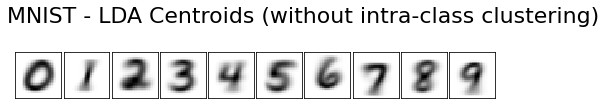

In [26]:
print_mnist(lda.mu_c_, title="MNIST - LDA Centroids (without intra-class clustering)")

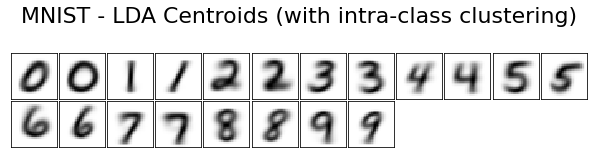

In [27]:
print_mnist(ldacc.mu_c_, title="MNIST - LDA Centroids (with intra-class clustering)")

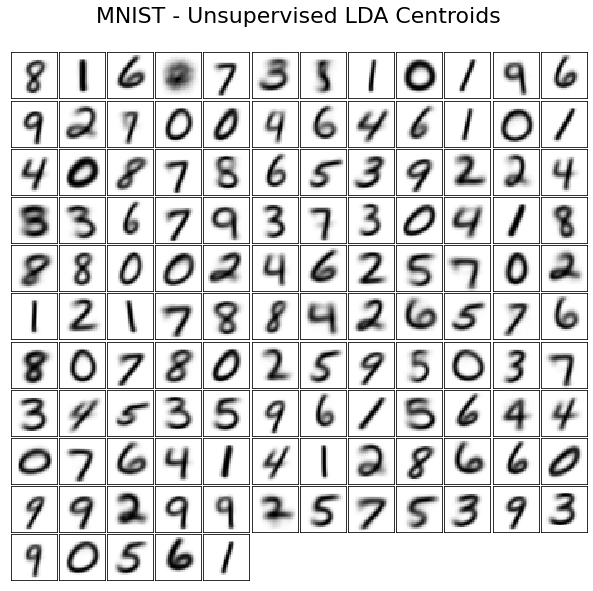

In [28]:
print_mnist(ulda.mu_c_, title="MNIST - Unsupervised LDA Centroids")